# <a href="https://mipt-stats.gitlab.io/courses/ad_mipt.html">Phystech@DataScience</a>
## Задание 1

**Правила:**

* Выполненную работу нужно отправить телеграм-боту, адрес которого будет указан на странице курса до конца недели. Обращаем ваше внимание, что в боте необходимо заранее зарегистрироваться и дождаться подтверждения.
* Дедлайн **1 октября в 22:00**. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате `ipynb` 
* Решения, размещенные на каких-либо интернет-ресурсах не принимаются. Публикация решения может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качествие основы, ничего не удаляя из него.

-----

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
import numpy as np
import scipy.stats as sps
from warnings import filterwarnings
from sklearn.neighbors import  NearestNeighbors


from sklearn.cluster import \
    KMeans, \
    AgglomerativeClustering, \
    DBSCAN
from scipy.cluster.hierarchy import dendrogram
import sklearn.datasets as datasets

In [3]:
!pip3 install umap_learn

Defaulting to user installation because normal site-packages is not writeable


In [2]:
from umap.umap_ import UMAP

# Задача 1

Рассмотрим датасет Leaf Classification (см. на Вики).

Данные содержат 1584 изображений образцов листьев (16 изображений для 99 видов). Размер некоторых изображений изменен, в результате чего все изображения имеют одинаковый размер $170×250$. Скачайте файл с данными на сайте курса.

(a) Загрузите все изображения с помощью `plt.imread` и визуализируйте некоторые из них. Каждое изображение — матрица размера $170×250$.

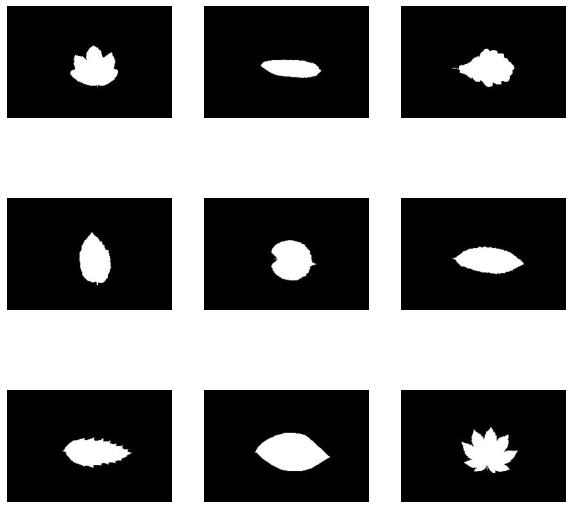

In [3]:
n_images = 1584
X = []

for i in range(n_images):
    new_img = plt.imread('scaled_images/' + str(i + 1) + '.jpg')
    X.append(new_img)
    
X = np.array(X)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(X[i], cmap='gray')
    plt.axis('off')
plt.show()

Сделаем также так, чтобы каждое изображение было представлено не матрицей, а одним вектором из всех пикселей

In [15]:
X = X.reshape(n_images, 170*250)
X.shape

(1584, 42500)

(b) В файле `train_labels.csv` указаны номера образцов листьев, которые относятся к обучающей части данных, а также их виды. Разделите данные на обучающую и тестовую часть.

In [11]:
labels = pd.read_csv('train_labels.csv')
labels.head(10)

,id,species
0,1,Acer_Opalus
1,2,Pterocarya_Stenoptera
2,3,Quercus_Hartwissiana
3,5,Tilia_Tomentosa
4,6,Quercus_Variabilis
5,8,Magnolia_Salicifolia
6,10,Quercus_Canariensis
7,11,Quercus_Rubra
8,14,Quercus_Brantii
9,15,Salix_Fragilis


In [16]:
X_train = []
X_test = []
for i in range(X.shape[0]):
    if i in (labels.id.to_numpy()-1):
        X_train.append(X[i])
    else:
        X_test.append(X[i])

X_train = np.array(X_train)
X_test = np.array(X_test)

Отсортируем теперь по алфавиту названия видов и построим отображение строки в индекс.

In [18]:
species_names = sorted(np.unique(labels.species))
name_to_ind = dict([(name, i) for (i, name) in enumerate(species_names)])
labels.species = labels.species.map(name_to_ind)

(c) На обучающей части данных постройте 30 главных компонент. Какую долю дисперсии данных они объясняют? Какую долю дисперсии объясняет каждая компонента отдельно? Постройте график доли объясненной дисперсии. Сделайте вывод.

In [19]:
pca = PCA(n_components=30)

Y = pca.fit_transform(X_train)

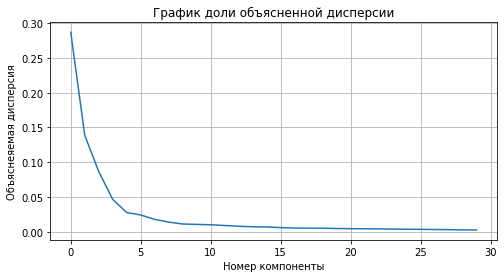

In [20]:
plt.figure(figsize=(8, 4))
plt.plot(pca.explained_variance_ratio_)

plt.title('График доли объясненной дисперсии')
plt.xlabel('Номер компоненты')
plt.ylabel('Объяснеяемая дисперсия')

plt.grid()

plt.show()

**Вывод**: Можно взять и меньше 30 компонент, т.к. "хвост" графика показывает, что последние компоненты очень мало объясняют данные.

(d) Визуализируйте главные компоненты. Для этого обратно перейдите обратно из представления изображения в виде одного длинного вектора к матрице. Можете ли вы их как-то охарактеризовать?

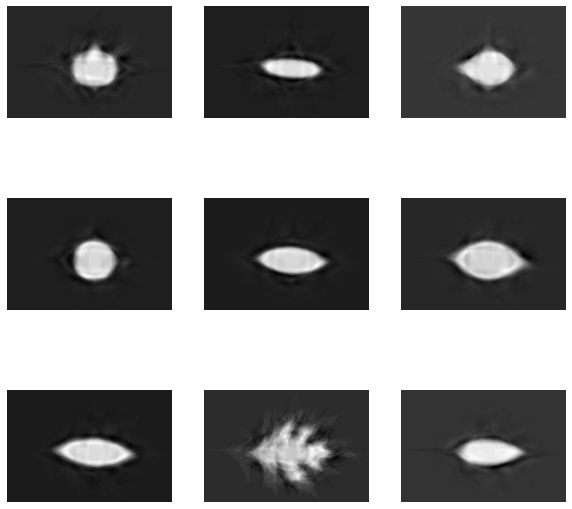

In [21]:
X_hat = pca.inverse_transform(Y)

X_hat = X_hat.reshape(990, 170, 250)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(X_hat[i], cmap='gray')
    plt.axis('off')
plt.show()

**Вывод**: Да, "на глаз" видно, что картинки разные. Уверен, что ботаник смог бы сказать, что есть что. Что в очередной раз подтверждает, что уменьшив размерность до 30 мы потеряли не много информации. 

(e) Визуализируйте обучающую часть данных в проекции на две первых главных компоненты. Цвет точки должен соответствовать виду образца. Используйте `cmap=’Set1’` во избежание градации цвета по номеру вида. Наблюдаются ли какие-либо закономерности?

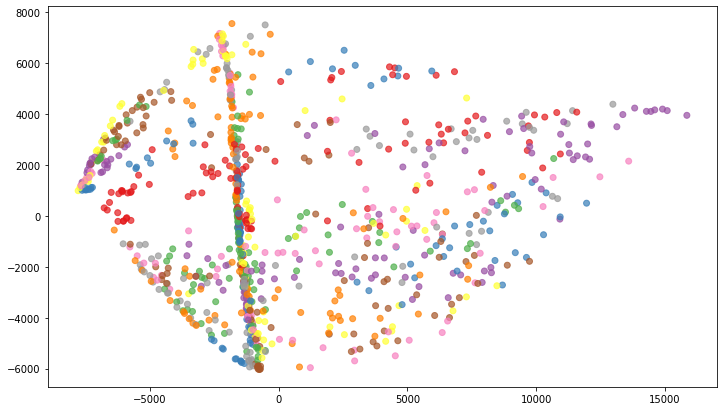

In [22]:
plt.figure(figsize=(12, 7))

plt.scatter(Y[:, 0], Y[:, 1], c=labels.species, alpha=0.7, cmap='Set1')

plt.show()

Никаких закономерностей не наблюдается, видов слишком много. Да, есть странная почти вертикальная прямая, но из-за огромного(и того, что все образцы в ней встречаются) количества образцов это интерпретировать как взаимосвязь между похожими образцами нельзя.

(f) Визуализируйте данные при помощи t-SNE двумя способами — на основе исходных признаков (пиксели) и по проекциям на первые 30 главных компонент. Кластеризуются ли точки? Сравните также время работы.

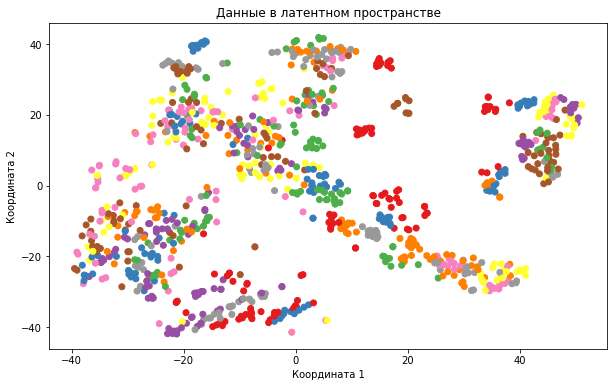

CPU times: user 23.7 s, sys: 4.01 s, total: 27.7 s
Wall time: 3.77 s


In [23]:
%%time
n_components = 2

tsne = TSNE(n_components=n_components)
X_hat = tsne.fit_transform(X_train)

plt.figure(figsize=(10, 6))
plt.scatter(X_hat[:, 0], X_hat[:, 1], c=labels.species, cmap='Set1')
plt.xlabel('Координата 1')
plt.ylabel('Координата 2')
plt.title('Данные в латентном пространстве')
plt.show()

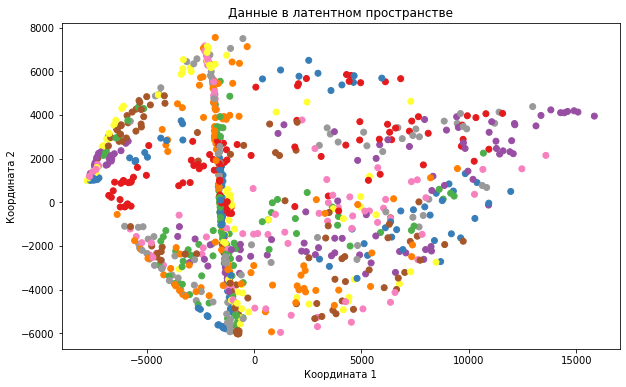

CPU times: user 14.8 s, sys: 373 ms, total: 15.1 s
Wall time: 2.1 s


In [24]:
%%time
n_components = 2

tsne = TSNE(n_components=n_components)
Y_hat = tsne.fit_transform(Y)

plt.figure(figsize=(10, 6))
plt.scatter(Y[:, 0], Y[:, 1], c=labels.species, cmap='Set1')
plt.xlabel('Координата 1')
plt.ylabel('Координата 2')
plt.title('Данные в латентном пространстве')
plt.show()

**Вывод**: После применения PCA можно увидеть какую-то кластерную структуру(но не про образцам!), после применения до PCA t-SNE просто проецирует на 2 главные компоненты и мы получаем график как в прошлом пункте.

(g)

В методе t-SNE каждая точка "хочет" переехать в новое пространство вместе со своими соседями. Проверим, действительно ли это так на практике. Посчитайте для каждой точки $i$ долю тех $j$ из $k$ ее ближайших соседей в исходном пространстве, которые также оказались в числе ее $k$ соседей в конечном пространстве, и выведите среднюю по всем точкам $i$ долю. Проведите исследование для нескольких разных $k$. Сделайте выводы.

Для подсчета $k$-соседей можно использовать метод `kneighbors` для  [`sklearn.neighbors.NearestNeighbors`](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html).


In [25]:
k_array = np.array([1,2,3, 5, 7, 10, 15, 25, 50])

for k in k_array:
    j_array = []
    neigh_origin = NearestNeighbors(n_neighbors=k)
    neigh_final = NearestNeighbors(n_neighbors=k)
    neigh_origin.fit(X_train)
    neigh_final.fit(X_hat)
    nn_origin = neigh_origin.kneighbors(X_train, return_distance=False)
    nn_final = neigh_final.kneighbors(X_hat, return_distance=False)
    for i in range(nn_final.shape[0]):
        tmp_j=0
        for j in nn_final[i]:
            if j in nn_origin[i]:
                tmp_j+=1
        j_array.append(tmp_j)  
    j_array = np.array(j_array)
    print("Для k="+str(k) + " доля равна " + str((j_array/k).mean()))

Для k=1 доля равна 1.0
Для k=2 доля равна 0.8277777777777777
Для k=3 доля равна 0.7565656565656566
Для k=5 доля равна 0.7064646464646465
Для k=7 доля равна 0.6825396825396823
Для k=10 доля равна 0.6684848484848485
Для k=15 доля равна 0.6503030303030303
Для k=25 доля равна 0.6502626262626262
Для k=50 доля равна 0.6704646464646464


**Вывод**: Да, всё так и есть. Чем больше k тем меньше соседей она перетаскивает с собой( до определенного k*, после него всё будет возрастать).

(h*) По проекциям данных на первые 30 главных компонент обучите многоклассовую классификацию.

Используйте KNeighboursClassifier - см. прошлый семестр. 

Разделите данные на тренировочную и валидационную выборки и проверьте качество этой модели по метрике accuracy. Так как метки классов известны только для части данных, используйте только их. Сравните с результатом без применения PCA. Сделайте выводы.

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

In [27]:
Y_train, Y_test, a_train, a_test = train_test_split(Y, labels.species.to_numpy(),
                                                    test_size=0.20)

X_wPCA_train, X_wPCA_test, a_wPCA_train, a_wPCA_test =  train_test_split(X_train, 
                                                            labels.species.to_numpy(),
                                                            test_size=0.20)

In [28]:
model = KNeighborsClassifier()
model = model.fit(Y_train, a_train)

a_pred = model.predict(Y_test)
print("Точность классификатора по метрике accuracy после использования PCA "+
      str((a_pred == a_test).sum()/a_test.shape[0]))


model = KNeighborsClassifier()
model = model.fit(X_wPCA_train, a_wPCA_train)


a_pred = model.predict(X_wPCA_test)
print("Точность классификатора по метрике accuracy без использования PCA "+
      str((a_pred == a_wPCA_test).sum()/a_wPCA_test.shape[0]))

Точность классификатора по метрике accuracy после использования PCA 0.5
Точность классификатора по метрике accuracy без использования PCA 0.5252525252525253


**Вывод**: Классификатор оказался не очень хорошим, метрика Accuracy показывает, что он угадывает только в 50% случаев, это конечно лучше чем ничего, но и метрика Accuracy не самая хорошая. В общем такой классификатор использовать нельзя по причине не информативности.

# Задача 2


В кишечнике человека живут триллионы микроорганизмов. Они могут влиять на совершенно различные процессы в организме. Однако на данный момент мы находимся лишь в самом начале пути изучения  механизмов их взаимодействия с организмом хозяина. Сейчас влияние микробиоты изучают во многих сферах медицины: в онкологии, психиатрии... 

Состави микробиоты у каждого человека свой. Однако важна не только похожесть состава, но и функции тех или иных организмов, в частности белки, которые они производят. Весьма много информации могут нам дать данные [метагеномного секвенирования](https://www.news-medical.net/life-sciences/Shotgun-Metagenomic-Sequencing.aspx). Этот тип секвенирования позволяет получать короткие последовательности ДНК от всех организмов в образце вместе, то есть не разделяя ДНК по организмам. Использование метагеномного секвнирования помогло обнаружить, насколько распространены гены антибиотиков в наших кишечных бактериях.

На данный момент мы остановимся лишь на изучении того, какие организмы живут в кишечнике различных людей, а не на их функциях. Эти данные можно получить из данных метагеномного секвенирования, рассмотрев различные последовательности ДНК, соответствующие одной из субъединиц рибосомы. Оказывается,что по эти последовательности уникальны у каждого вида, и таким образом легко понять, какие микроорганизмы присутствуют в образце.

Скачайте [датасет](https://www.kaggle.com/antaresnyc/human-metagenomics?select=abundance_stoolsubset.csv). Мы будем использовать файл `abundance_stoolsubset.csv`, в котором лежат уже предобработанные данные о том, ДНК каких организмов обнаружена в образцах микробиоты кишечника и в каком количестве.

Этот датасет был взят из статьи 
["Machine Learning Meta-analysis of Large Metagenomic Datasets: Tools and Biological Insights"
](https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1004977) Pasolli et al.







In [4]:
data = pd.read_csv("./abundance_stoolsubset.csv")

Посмотрите на данные визуально. Какие колонки есть в данных?

In [5]:
data.head(7)

,dataset_name,sampleID,subjectID,bodysite,disease,age,gender,country,sequencing_technology,pubmedid,...,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Enterococcaceae|g__Enterococcus|s__Enterococcus_gilvus|t__Enterococcus_gilvus_unclassified,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Lactobacillaceae|g__Lactobacillus|s__Lactobacillus_otakiensis,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Lactobacillaceae|g__Lactobacillus|s__Lactobacillus_otakiensis|t__GCF_000415925,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum|s__Desulfotomaculum_ruminis,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum|s__Desulfotomaculum_ruminis|t__GCF_000215085,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Ruminococcaceae|g__Faecalibacterium|s__Faecalibacterium_prausnitzii|t__GCF_000209855,k__Bacteria|p__Firmicutes|c__Negativicutes|o__Selenomonadales|f__Veillonellaceae|g__Megasphaera|s__Megasphaera_sp_BV3C16_1,k__Bacteria|p__Firmicutes|c__Negativicutes|o__Selenomonadales|f__Veillonellaceae|g__Megasphaera|s__Megasphaera_sp_BV3C16_1|t__GCF_000478965
0,Candela_Africa,H10,h10,stool,n,40,female,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Candela_Africa,H11,h11,stool,n,29,female,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Candela_Africa,H12,h12,stool,n,8,female,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Candela_Africa,H13,h13,stool,n,34,male,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Candela_Africa,H14,h14,stool,n,30,male,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Candela_Africa,H15,h15,stool,n,16,male,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Candela_Africa,H16,h16,stool,n,21,male,tanzania,Illumina,25981789,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


В данных есть много метаданных об образце. Их мы использовать не будем, так как хотим сравнивать людей по микроорганизмам. 

Метаданные занимают первые 210 колонок. Удалите их.



In [80]:
data = data[data.columns[211:]]

Посмотрите, какие остались колонки? Сколько их? Нужно ли снижать размерность?

In [7]:
data.head(10)

,k__Archaea,k__Archaea|p__Euryarchaeota,k__Archaea|p__Euryarchaeota|c__Methanobacteria,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae|g__Methanobrevibacter,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae|g__Methanobrevibacter|s__Methanobrevibacter_smithii,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae|g__Methanobrevibacter|s__Methanobrevibacter_smithii|t__Methanobrevibacter_smithii_unclassified,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae|g__Methanobrevibacter|s__Methanobrevibacter_unclassified,k__Archaea|p__Euryarchaeota|c__Methanobacteria|o__Methanobacteriales|f__Methanobacteriaceae|g__Methanosphaera,...,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Enterococcaceae|g__Enterococcus|s__Enterococcus_gilvus|t__Enterococcus_gilvus_unclassified,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Lactobacillaceae|g__Lactobacillus|s__Lactobacillus_otakiensis,k__Bacteria|p__Firmicutes|c__Bacilli|o__Lactobacillales|f__Lactobacillaceae|g__Lactobacillus|s__Lactobacillus_otakiensis|t__GCF_000415925,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum|s__Desulfotomaculum_ruminis,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Peptococcaceae|g__Desulfotomaculum|s__Desulfotomaculum_ruminis|t__GCF_000215085,k__Bacteria|p__Firmicutes|c__Clostridia|o__Clostridiales|f__Ruminococcaceae|g__Faecalibacterium|s__Faecalibacterium_prausnitzii|t__GCF_000209855,k__Bacteria|p__Firmicutes|c__Negativicutes|o__Selenomonadales|f__Veillonellaceae|g__Megasphaera|s__Megasphaera_sp_BV3C16_1,k__Bacteria|p__Firmicutes|c__Negativicutes|o__Selenomonadales|f__Veillonellaceae|g__Megasphaera|s__Megasphaera_sp_BV3C16_1|t__GCF_000478965
0,0.24169,0.24169,0.24169,0.24169,0.24169,0.24169,0.24169,0.24169,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.50621,0.50621,0.50621,0.50621,0.50621,0.50621,0.50621,0.50621,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.30522,0.30522,0.30522,0.30522,0.30522,0.30522,0.30522,0.30522,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.40133,0.40133,0.40133,0.40133,0.40133,0.35994,0.35994,0.35994,0.00000,0.04139,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.17479,0.17479,0.17479,0.17479,0.17479,0.16331,0.15280,0.15280,0.01051,0.01148,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.98590,1.98590,1.98590,1.98590,1.98590,1.98590,1.98590,1.98590,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.09453,0.09453,0.09453,0.09453,0.09453,0.09259,0.09170,0.09170,0.00089,0.00194,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.70448,0.70448,0.70448,0.70448,0.70448,0.66628,0.66628,0.66628,0.00000,0.03820,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.03585,0.03585,0.03585,0.03585,0.03585,0.03585,0.03585,0.03585,0.00000,0.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
data.shape

(1989, 2128)

Да, куча информации, которая вероятнее всего является лишней.

Если посмотреть на данные, то можно заметить, что учитываются как количества ДНК организмов каждого вида, так и более высших иерархических единиц. Таким образом, в данных присутствует избыточность, так как некоторые столбцы просто являются линейной комбинацией друг друга.

Снизьте размерность с помощью PCA. Подберите оптимальное количество главных компонент.

Для подбора оптимального количества главных компонент построим график доли объясненной дисперсии. 

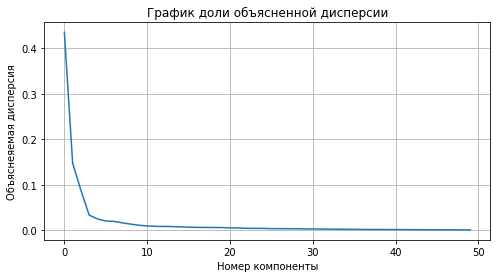

In [9]:
pca = PCA(n_components=50)
pca.fit_transform(data.to_numpy())

plt.figure(figsize=(8, 4))
plt.plot(pca.explained_variance_ratio_)

plt.title('График доли объясненной дисперсии')
plt.xlabel('Номер компоненты')
plt.ylabel('Объяснеяемая дисперсия')
plt.grid()

plt.show()

И посмотри сколько всего дисперсии объяснено для k=25.

In [10]:
pca = PCA(n_components=25)
new_data = pca.fit_transform(data.to_numpy())

pca.explained_variance_ratio_.sum()

0.9136507864880018

Очень хорошо! В дальнейшием будем использовать k=25.

Визуализируйте данные с помощью t-SNE и UMAP. Используйте особенности методов. Не забудьте пояснить свое решение.

Визуализация t-SNE.

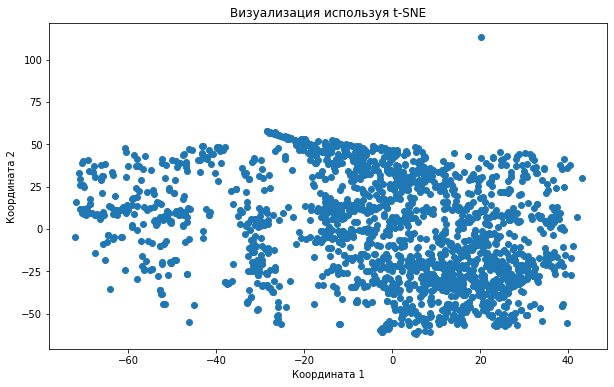

In [83]:
n_components = 2

tsne = TSNE(n_components=n_components)
data_tSNE = tsne.fit_transform(new_data)
old_data_tSNE = tsne.fit_transform(data)

plt.figure(figsize=(10, 6))
plt.scatter(data_tSNE[:, 0], old_data_tSNE[:, 1], cmap='Set1')
plt.xlabel('Координата 1')
plt.ylabel('Координата 2')
plt.title('Визуализация используя t-SNE')
plt.show()

Визуализация UMAP.

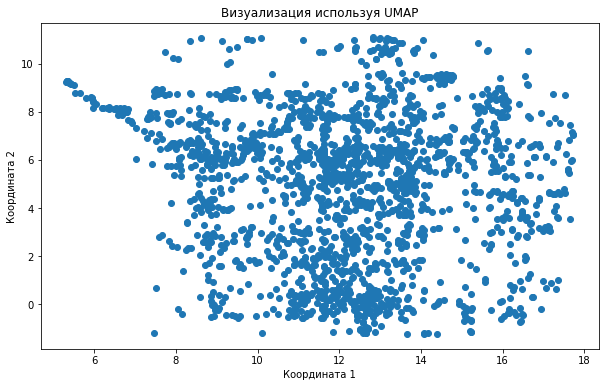

In [82]:
n_components = 2

data_UMAP = UMAP(n_components=2).fit_transform(new_data)
old_data_UMAP = UMAP(n_components=2).fit_transform(data)

plt.figure(figsize=(10, 6))
plt.scatter(old_data_UMAP[:, 0], data_UMAP[:, 1], cmap='raindow')
plt.xlabel('Координата 1')
plt.ylabel('Координата 2')
plt.title('Визуализация используя UMAP')
plt.show()

Теперь перейдем к кластеризации. Попробуйте кластеризовать данные в исходном пространстве и в пространстве после применения PCA с помощью DBSCAN, Kmeans и агломеративной кластеризации. Визуализируйте полученные результаты кластеризации с помощью t-SNE и UMAP, выделяя разные кластеры цветом. В этом может помочь аргумент `c` метода `scatter`. Хорошо ли работают методы? Попробуйте поизменять  параметры. Сделайте выводы.

Оформите все красиво и структурированно.

*) Также можете реализовать на выбор какую-либо метрику качества кластеризации и выводить ее в процессе исследования. Поясните полученные результаты.

#### K-means.

In [13]:
data_pred_pca_kmeans = []
data_pred_kmeans = []

for n in range(2, 7): 
    kmeans = KMeans(n_clusters=n)
    kmeans.fit(new_data)
    data_pred_pca_kmeans.append(kmeans.predict(new_data))
    kmeans.fit(data)
    data_pred_kmeans.append(kmeans.predict(data))

data_pred_pca_kmeans = np.array(data_pred_pca_kmeans)
data_pred_kmeans = np.array(data_pred_kmeans)

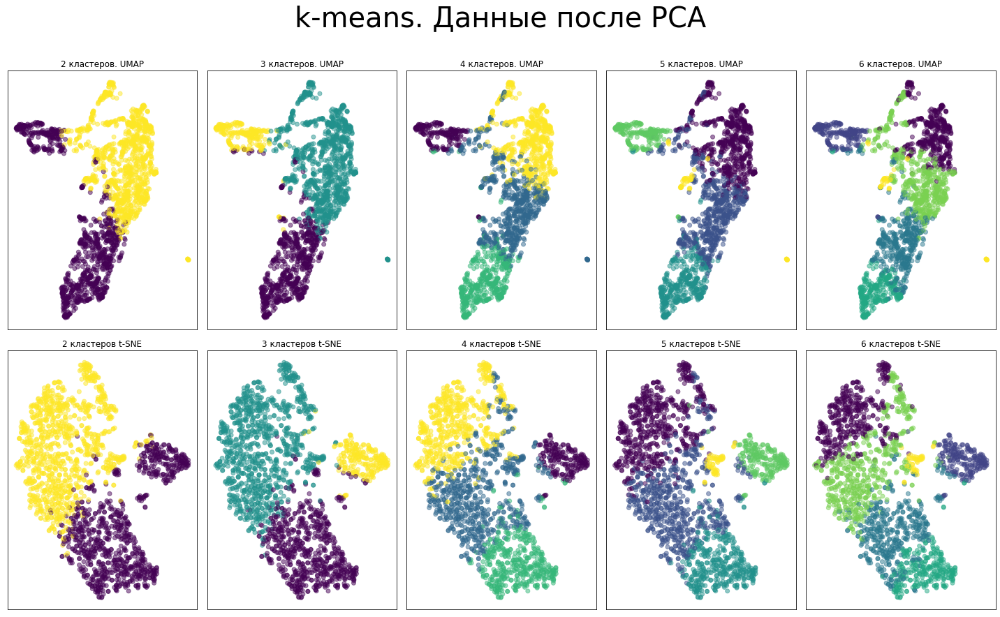

In [14]:
#Визуализация данных после PCA. K-means
fig = plt.figure(figsize=(20, 12))

for n in range(2, 7):
    n_components = 2

    plt.subplot(2, 5, n - 1)
    plt.scatter(data_UMAP[:, 0], data_UMAP[:, 1], c=data_pred_pca_kmeans[n-2], alpha=0.5)
    plt.title(f'{n} кластеров. UMAP')
    plt.xticks([]), plt.yticks([])
    
    plt.subplot(2, 5, n - 1+5)
    plt.scatter(data_tSNE[:, 0], data_tSNE[:, 1], c=data_pred_pca_kmeans[n-2], alpha=0.5)
    plt.title(f'{n} кластеров t-SNE')
    plt.xticks([]), plt.yticks([])

    

fig.suptitle('k-means. Данные после PCA', y=1.02, size=40)
plt.tight_layout()

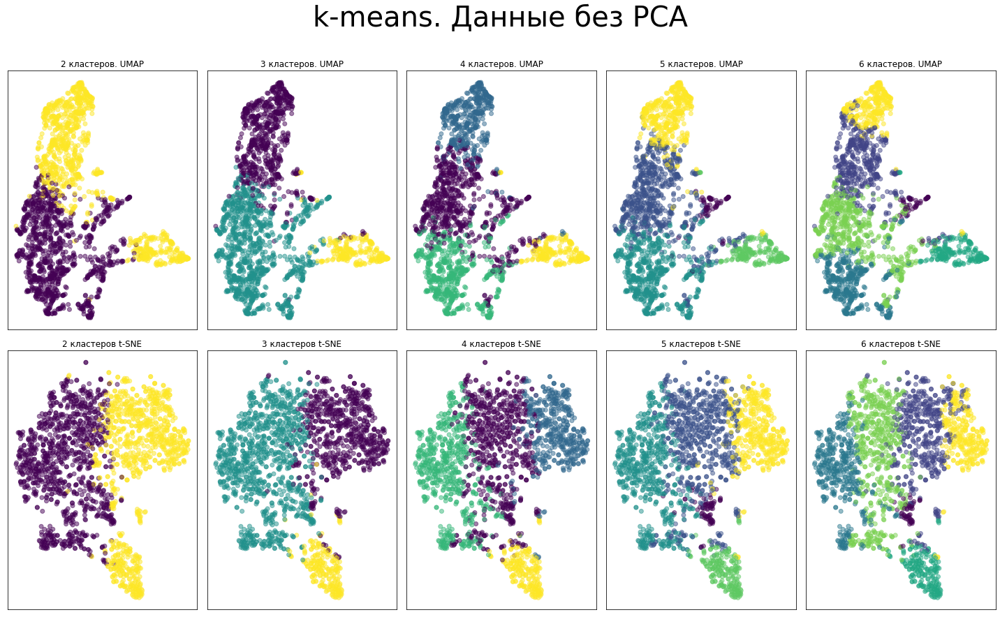

In [15]:
#Визуализация данных до PCA. K-means
fig = plt.figure(figsize=(20, 12))

for n in range(2, 7):
    n_components = 2

    plt.subplot(2, 5, n - 1)
    plt.scatter(old_data_UMAP[:, 0], old_data_UMAP[:, 1], c=data_pred_kmeans[n-2], alpha=0.5)
    plt.title(f'{n} кластеров. UMAP')
    plt.xticks([]), plt.yticks([])
    
    plt.subplot(2, 5, n - 1+5)
    plt.scatter(old_data_tSNE[:, 0], old_data_tSNE[:, 1], c=data_pred_kmeans[n-2], alpha=0.5)
    plt.title(f'{n} кластеров t-SNE')
    plt.xticks([]), plt.yticks([])

    

fig.suptitle('k-means. Данные без PCA', y=1.02, size=40)
plt.tight_layout()

#### DBSCAN

**Данные после PCA**

In [26]:
filterwarnings('ignore', category=FutureWarning)
eps, min_samples = np.meshgrid(
    np.linspace(0.01, 0.1, 5), np.arange(1, 6 ,1))

data_pred_dbscan_pca = []
data_pred_dbscan = []

for i in range(5):
    tmp = []
    tmp1 = []
    for j in range(5):
        dbscan = DBSCAN(eps[i, j], min_samples[i, j])
        
        tmp.append(dbscan.fit_predict(new_data))
            
        tmp1.append(dbscan.fit_predict(data))
    
    data_pred_dbscan_pca.append(tmp)
    data_pred_dbscan.append(tmp1)
    
data_pred_dbscan_pca = np.array(data_pred_dbscan_pca)
data_pred_dbscan = np.array(data_pred_dbscan)

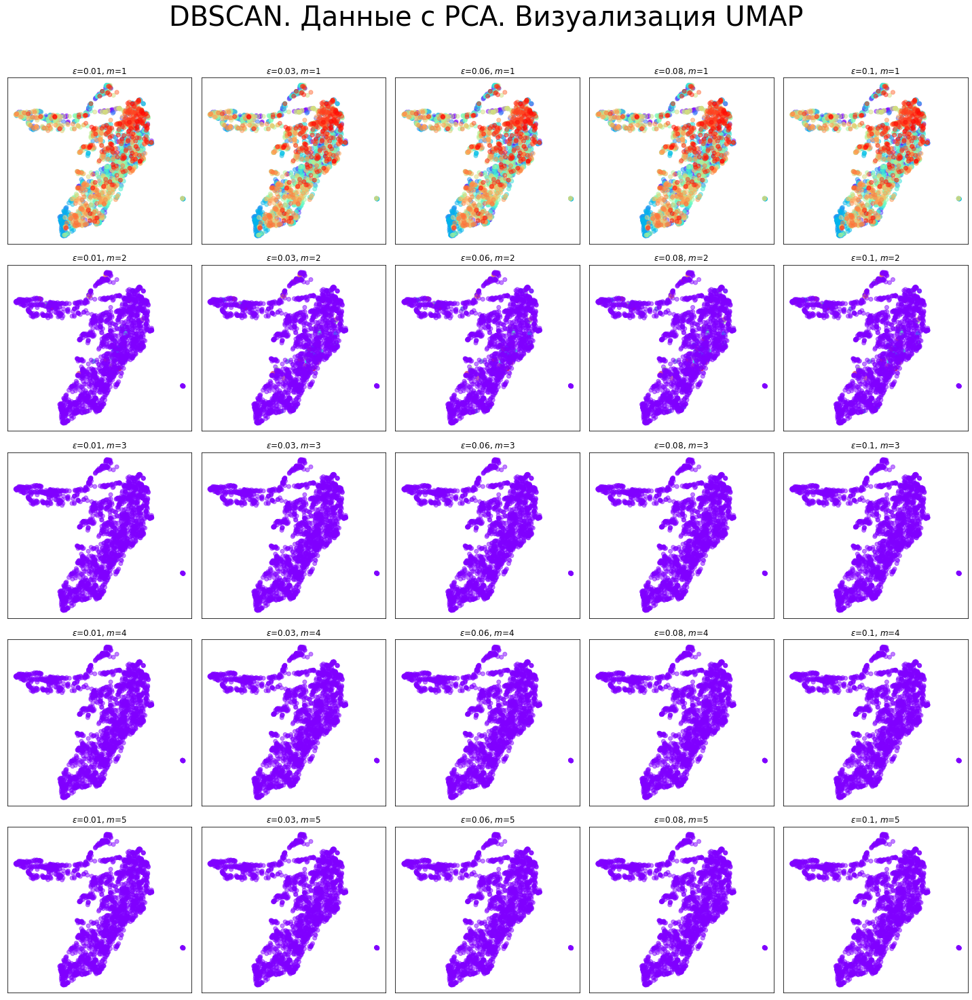

In [27]:

plt.rcParams['image.cmap'] = 'rainbow'
fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
                
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(data_UMAP[:, 0], data_UMAP[:, 1], 
                    c=data_pred_dbscan_pca[i,j], alpha=0.5)
        
        plt.title(
            f'$\\varepsilon$={np.round(eps[i, j], 2)}, $m$={min_samples[i, j]}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('DBSCAN. Данные с PCA. Визуализация UMAP', y=1.02, size=40)
plt.tight_layout()

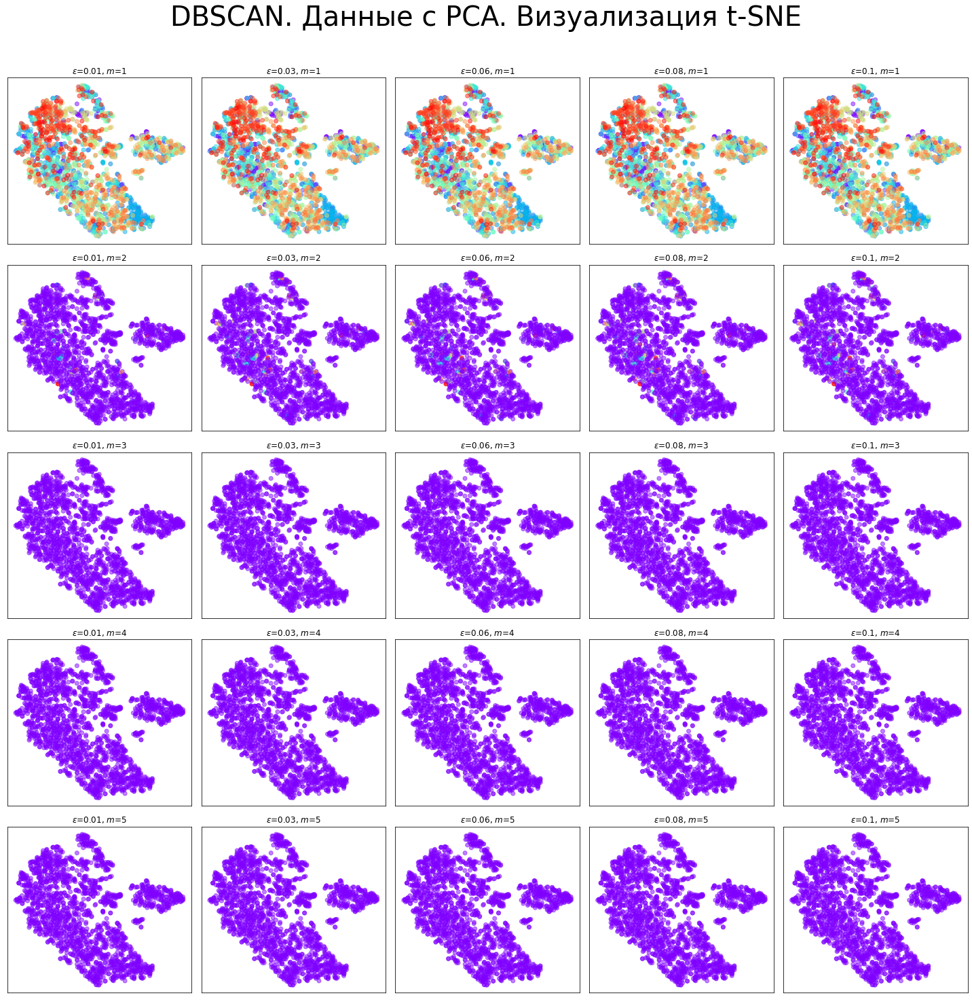

In [28]:
fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
                
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(data_tSNE[:, 0], data_tSNE[:, 1], 
                    c=data_pred_dbscan_pca[i,j], alpha=0.5)
        
        plt.title(
            f'$\\varepsilon$={np.round(eps[i, j], 2)}, $m$={min_samples[i, j]}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('DBSCAN. Данные с PCA. Визуализация t-SNE', y=1.02, size=40)
plt.tight_layout()

**Данные без PCA**

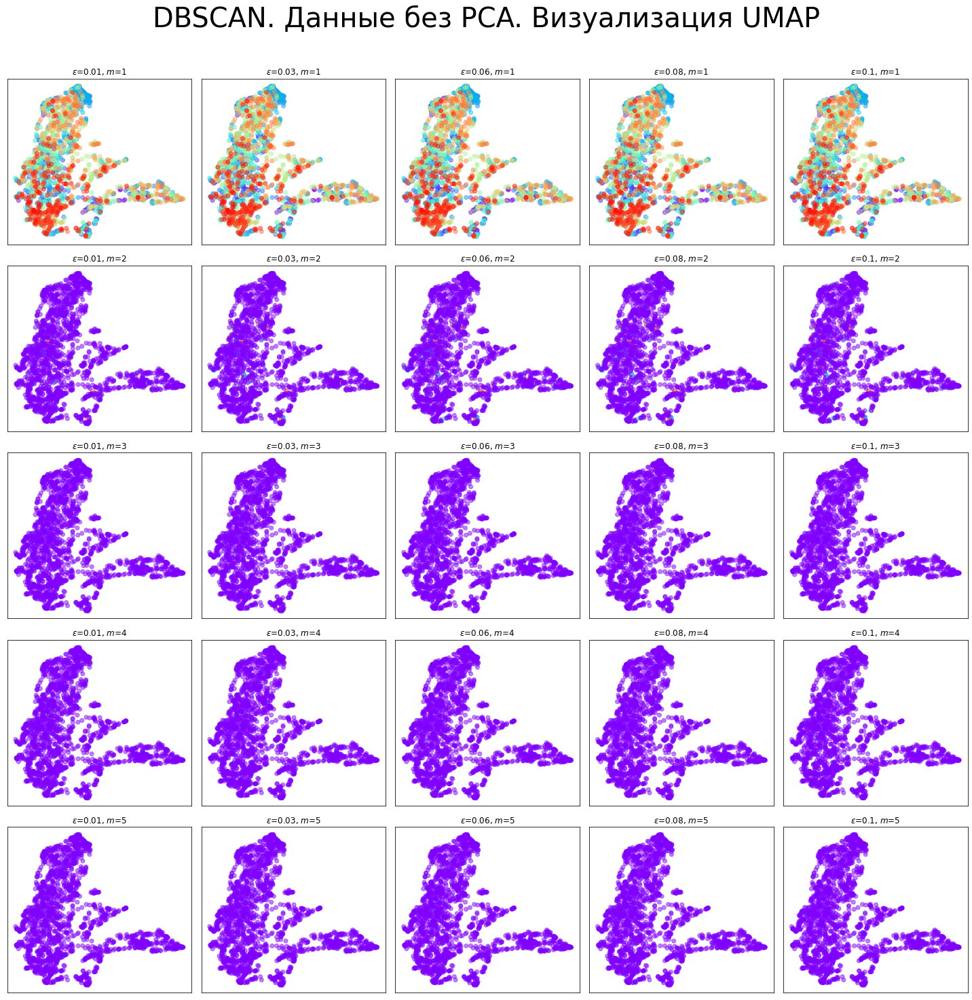

In [30]:
fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
                
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(old_data_UMAP[:, 0], old_data_UMAP[:, 1], 
                    c=data_pred_dbscan[i,j], alpha=0.5)
        
        plt.title(
            f'$\\varepsilon$={np.round(eps[i, j], 2)}, $m$={min_samples[i, j]}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('DBSCAN. Данные без PCA. Визуализация UMAP', y=1.02, size=40)
plt.tight_layout()

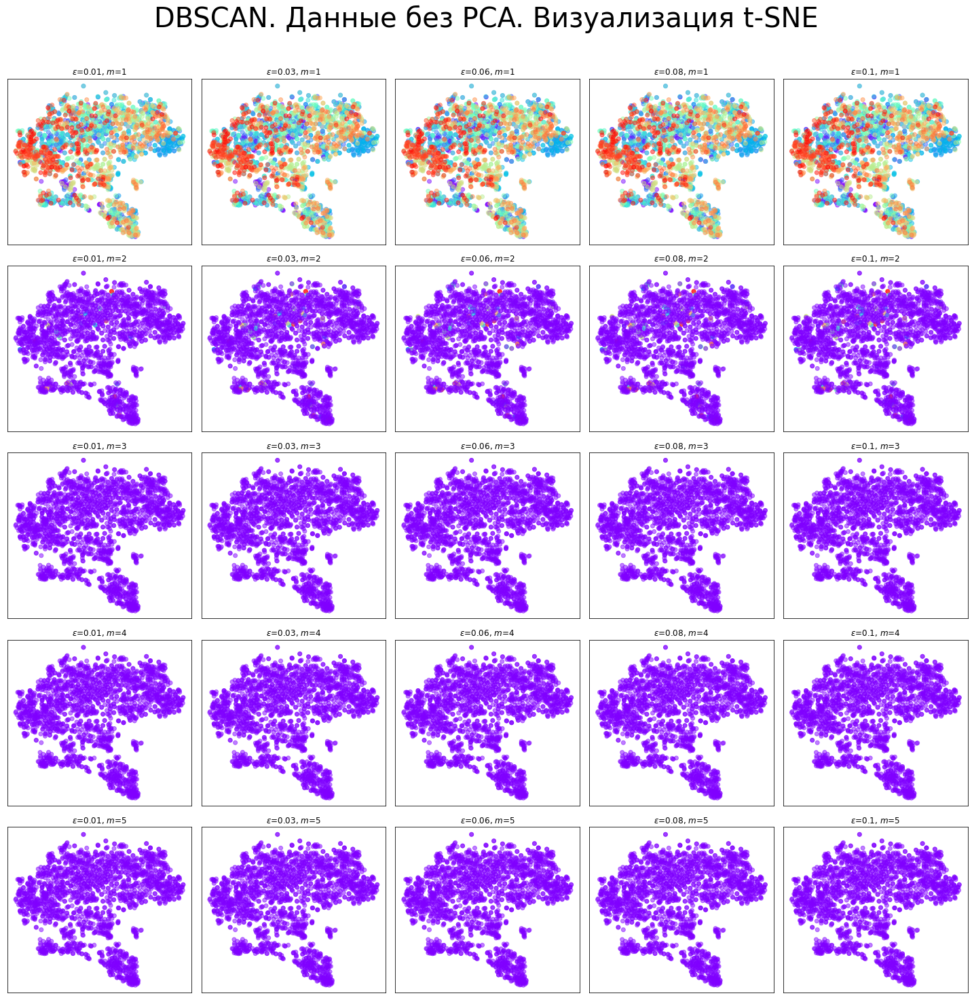

In [32]:
fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
                
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(old_data_tSNE[:, 0], old_data_tSNE[:, 1], 
                    c=data_pred_dbscan[i,j], alpha=0.5)
        
        plt.title(
            f'$\\varepsilon$={np.round(eps[i, j], 2)}, $m$={min_samples[i, j]}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('DBSCAN. Данные без PCA. Визуализация t-SNE', y=1.02, size=40)
plt.tight_layout()

#### Агломеративная

In [70]:
data_pred_pca_agglom = []
data_pred_agglom = []

for n in range(2, 7): 
    agglomerat = AgglomerativeClustering(n_clusters=n)
    agglomerat.fit(new_data)

    data_pred_pca_agglom.append(agglomerat.labels_)
    
    agglomerat.fit(data)
    data_pred_agglom.append(agglomerat.labels_)

data_pred_pca_agglom = np.array(data_pred_pca_agglom)
data_pred_agglom = np.array(data_pred_agglom)

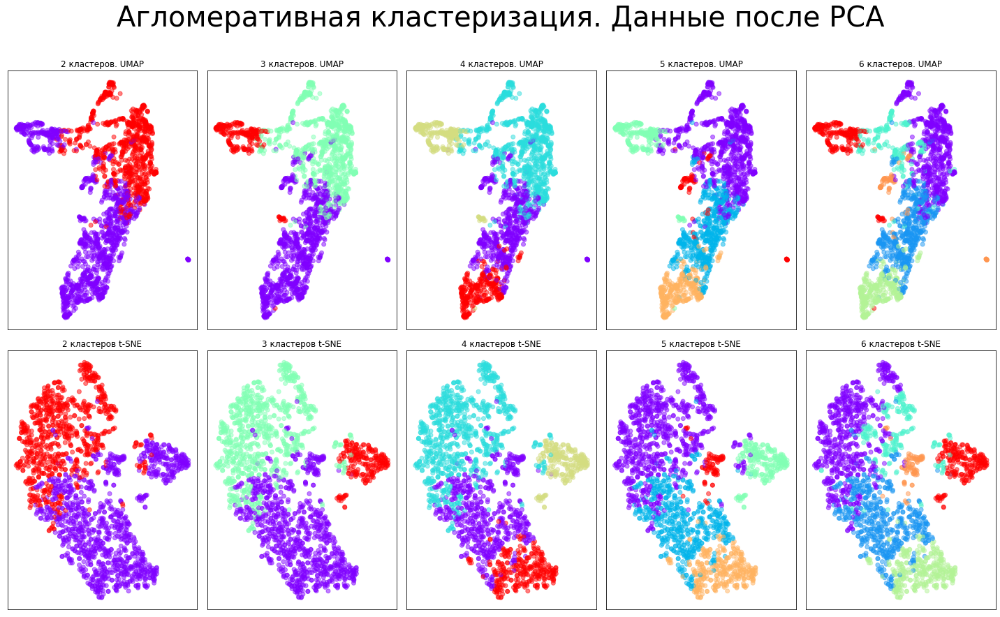

In [71]:
#Визуализация данных после PCA. Агломеративная кластеризация
fig = plt.figure(figsize=(20, 12))

for n in range(2, 7):
    n_components = 2

    plt.subplot(2, 5, n - 1)
    plt.scatter(data_UMAP[:, 0], data_UMAP[:, 1], c=data_pred_pca_agglom[n-2], alpha=0.5)
    plt.title(f'{n} кластеров. UMAP')
    plt.xticks([]), plt.yticks([])
    
    plt.subplot(2, 5, n - 1+5)
    plt.scatter(data_tSNE[:, 0], data_tSNE[:, 1], c=data_pred_pca_agglom[n-2], alpha=0.5)
    plt.title(f'{n} кластеров t-SNE')
    plt.xticks([]), plt.yticks([])

    

fig.suptitle('Агломеративная кластеризация. Данные после PCA', y=1.02, size=40)
plt.tight_layout()

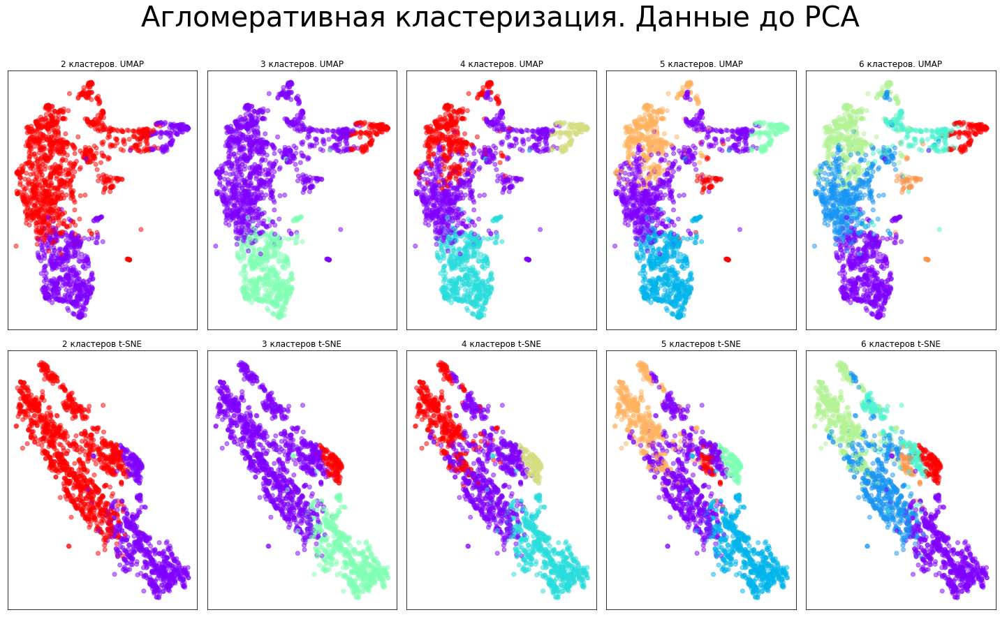

In [72]:
#Визуализация данных до PCA. Агломеративная кластеризация
fig = plt.figure(figsize=(20, 12))

for n in range(2, 7):
    n_components = 2

    plt.subplot(2, 5, n - 1)
    plt.scatter(old_data_UMAP[:, 0], data_UMAP[:, 1], c=data_pred_agglom[n-2], alpha=0.5)
    plt.title(f'{n} кластеров. UMAP')
    plt.xticks([]), plt.yticks([])
    
    plt.subplot(2, 5, n - 1+5)
    plt.scatter(old_data_tSNE[:, 0], data_tSNE[:, 1], c=data_pred_agglom[n-2], alpha=0.5)
    plt.title(f'{n} кластеров t-SNE')
    plt.xticks([]), plt.yticks([])

    

fig.suptitle('Агломеративная кластеризация. Данные до PCA', y=1.02, size=40)
plt.tight_layout()

**Вывод**: 
1) DBSCAN работает очень плохо, потому что данные сосредоточены очень близко друг к другу и dbscan быстро записывает их всех в один кластер.
2) Алгомеративная и k-means дают очень похожие результаты по которым всё равно трудно понять кластеризуются ли данные. Основные визуальные отличия этих двух способов -- при увеличении числа кластеров новая кластеризация KMEANS имеет более равносильные классны(равных размеров) в то же время в алгомеративной может добавится совсем маленький кластер.

Постройте дендрограмму для агломеративной кластеризации. Какого размера получаются кластеры?  Поясните по дендрограмме.

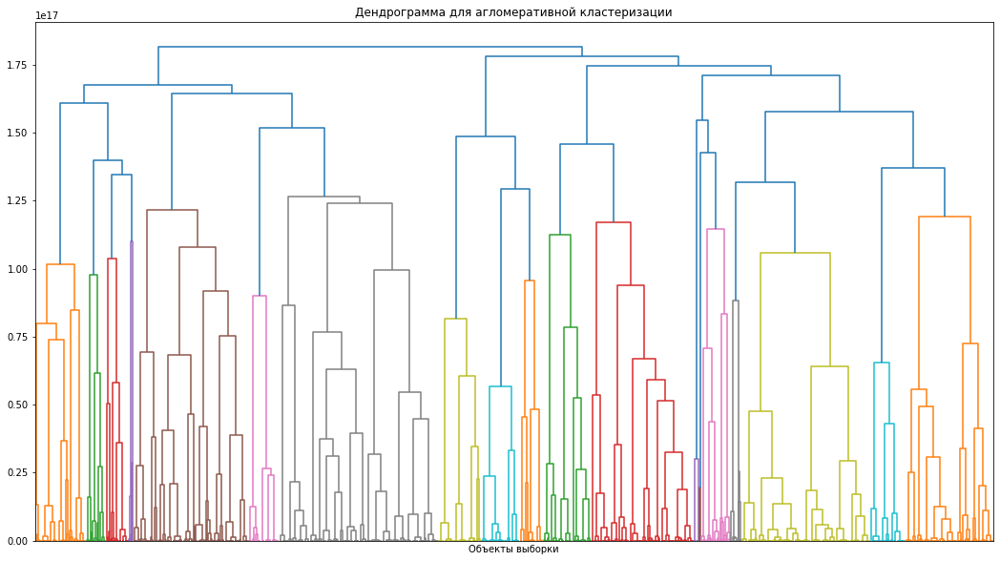

In [74]:
agglomerat = AgglomerativeClustering(n_clusters=1)
agglomerat.fit(new_data)


children  = agglomerat.children_

distance = np.arange(children.shape[0])

n_dots = np.arange(2, children.shape[0] + 2)
linkage_matrix = np.column_stack(
    [children, np.exp(distance / 50), n_dots]).astype(float)
plt.figure(figsize=(18, 10))
dendrogram(linkage_matrix, labels=agglomerat.labels_, 
           no_labels=True,
          )
plt.title('Дендрограмма для агломеративной кластеризации')
plt.xlabel('Объекты выборки')
plt.show()

Кластеры получаются маленьких размеров, что видно на дендрограмме, т.к. они быстро объединяются друг с другом. Так, к примеру, видно что кластерной структуры в данных нет, ибо они все похожи друг на друга.

*) Возьмите результат кластеризации, который кажется вам наиболее осмысленным, поясните свой выбор. Выделите наиболее часто встречающиеся микроорганизмы в каждом кластере, следите за форматом данных. Есть ли  различия? Сделайте выводы.





Хорошо ли кластеризуются люди по составу микробиоты или, скорее, определенных групп выделить нелья? Поясните свой ответ.

Сделайте общие выводы. 

С помощью тех данных, которые были ммной проверены можно сказать, что в них не имеется кластерной структуры.

Стало понятно, что t-SNE и UMAP имеют разные визуализации данных, но всё же больших различий между ними не много(если не использовать глубинные знания про них). Также с помощью кластеризации исходных данных и данных после PCA стало понятно, что они очень близки друг к другу и в будущем после грамотного уменьшения размерности к прежним данным можно не возвращаться. 